In [0]:
import mlflow

mlflow.pyspark.ml.autolog()


In [0]:
dbutils.fs.ls('dbfs:/FileStore/tables/steam_200k.csv')

Out[2]: [FileInfo(path='dbfs:/FileStore/tables/steam_200k.csv', name='steam_200k.csv', size=8059447, modificationTime=1709318150000)]

In [0]:

data = spark.read.csv('/FileStore/tables/steam_200k.csv',
                    header ='false',
                    inferSchema='true')


In [0]:
#Assign the colums names
data=data.toDF('Member_ID','Game_Name','Behaviour','Details')

The third column contains details of the member behaviour, either ‘purchase’ or ‘play’. Because a game has to be purchased before it can be played there will be two entries for the same game / member combination in some instances


The fourth is set to 1 for rows where the behaviour is ‘purchase’. For rows where the behavious is ‘play’ the value in the fourth column corresponds to the number of hours of play

In [0]:
data.display()

Member_ID,Game_Name,Behaviour,Details
151603712,The Elder Scrolls V Skyrim,purchase,1.0
151603712,The Elder Scrolls V Skyrim,play,273.0
151603712,Fallout 4,purchase,1.0
151603712,Fallout 4,play,87.0
151603712,Spore,purchase,1.0
151603712,Spore,play,14.9
151603712,Fallout New Vegas,purchase,1.0
151603712,Fallout New Vegas,play,12.1
151603712,Left 4 Dead 2,purchase,1.0
151603712,Left 4 Dead 2,play,8.9


In [0]:
from pyspark.sql.functions import col
print(data.count())
print(data.filter(col('Member_id').isNull()).count())
print(data.filter(col('game_name').isNull()).count())
print(data.filter(col('Details').isNull()).count())

200000
0
0
0


In [0]:
data.select(data['Game_Name']).distinct().count()

Out[7]: 5155

In [0]:
data.createOrReplaceTempView('data_temp')

##Display the 10 games that sold the most

In [0]:
%sql
select  distinct Game_Name,behaviour,count(*) as number_of_purchases
from data_temp
group by game_name,behaviour
having behaviour='purchase'
order by  number_of_purchases desc
limit 10

Game_Name,behaviour,number_of_purchases
Dota 2,purchase,4841
Team Fortress 2,purchase,2323
Unturned,purchase,1563
Counter-Strike Global Offensive,purchase,1412
Half-Life 2 Lost Coast,purchase,981
Counter-Strike Source,purchase,978
Left 4 Dead 2,purchase,951
Counter-Strike,purchase,856
Warframe,purchase,847
Half-Life 2 Deathmatch,purchase,823


###the most purchased game was dota 2 with 4841 purchases

### The visualization shows the top 10 purchased games

In [0]:
%sql
select  distinct Game_Name,behaviour,count(*) as number_of_purchases
from data_temp
group by game_name,behaviour
having behaviour='purchase'
order by  number_of_purchases desc
limit 10

Game_Name,behaviour,number_of_purchases
Dota 2,purchase,4841
Team Fortress 2,purchase,2323
Unturned,purchase,1563
Counter-Strike Global Offensive,purchase,1412
Half-Life 2 Lost Coast,purchase,981
Counter-Strike Source,purchase,978
Left 4 Dead 2,purchase,951
Counter-Strike,purchase,856
Warframe,purchase,847
Half-Life 2 Deathmatch,purchase,823


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

## Next we show the 10 highest average play time per player from the Top 10 games best sellers

###first we create a temp_wiew from the query of the top 10 best sellers

In [0]:
%sql
create or replace temporary view top_purchase_view as
select  distinct Game_Name,behaviour,count(*) as number_of_purchases
from data_temp
group by game_name,behaviour
having behaviour='purchase'
order by  number_of_purchases desc
limit 10

In [0]:
%sql
SELECT game_name, round(AVG(details),0) AS Avarage_hour_played
FROM data_temp
WHERE behaviour = 'play' AND game_name IN (SELECT Game_Name FROM top_purchase_view)
GROUP BY game_name
ORDER BY Avarage_hour_played DESC
LIMIT 3;

game_name,Avarage_hour_played
Counter-Strike,236.0
Counter-Strike Global Offensive,234.0
Dota 2,203.0


 this  next confirm that the avg is calculated in the right way

In [0]:
%sql
select game_name,avg(details) as avg_h_played
from data_temp 
where game_name='Counter-Strike' and behaviour = 'play'
group by game_name

game_name,avg_h_played
Counter-Strike,236.37517605633798


##Next, we check the distribution of the hours played for the top 3 games with the highest average playtime among the top 10 best sellers

In [0]:
%sql
select game_name,details as hours_played
from data_temp 
where game_name='Counter-Strike' and behaviour = 'play'


-- not normaly distributed

game_name,hours_played
Counter-Strike,0.2
Counter-Strike,211.0
Counter-Strike,91.0
Counter-Strike,1008.0
Counter-Strike,0.8
Counter-Strike,0.1
Counter-Strike,271.0
Counter-Strike,316.0
Counter-Strike,1.4
Counter-Strike,101.0


Databricks visualization. Run in Databricks to view.

In [0]:
%sql
select game_name,details as hours_played
from data_temp 
where game_name='Counter-Strike Global Offensive' and behaviour = 'play'

--not normaly distributed

game_name,hours_played
Counter-Strike Global Offensive,2.3
Counter-Strike Global Offensive,626.0
Counter-Strike Global Offensive,125.0
Counter-Strike Global Offensive,94.0
Counter-Strike Global Offensive,5.5
Counter-Strike Global Offensive,1028.0
Counter-Strike Global Offensive,7.4
Counter-Strike Global Offensive,853.0
Counter-Strike Global Offensive,231.0
Counter-Strike Global Offensive,13.4


Databricks visualization. Run in Databricks to view.

In [0]:
%sql
select game_name,details as hours_played
from data_temp 
where game_name='Dota 2' and behaviour = 'play'

game_name,hours_played
Dota 2,0.5
Dota 2,2.3
Dota 2,9.1
Dota 2,0.5
Dota 2,3.4
Dota 2,14.8
Dota 2,4.2
Dota 2,1784.0
Dota 2,1.1
Dota 2,7.4


Databricks visualization. Run in Databricks to view.

###So with the data available we see that the top 10 best seller is:
* Dota 2
* Team Fortress 2
* Unturned
* Counter-Strike Global Offensive
* Half-Life 2 Lost Coast
* Counter-Strike Source
* Left 4 Dead 2
* Counter-Strike
* Warframe
* Half-Life 2 Deathmatc

###And from this top10 best seller, the 3 games that in avarage have been played for the longest are:
* Counter-Strike with an avarage of 236 hours
* Counter-Strike Global Offensive with an avarage of 234 hours
* Dota 2 with an avarage of 203 hours 

In [0]:
display(data)

Member_ID,Game_Name,Behaviour,Details
151603712,The Elder Scrolls V Skyrim,purchase,1.0
151603712,The Elder Scrolls V Skyrim,play,273.0
151603712,Fallout 4,purchase,1.0
151603712,Fallout 4,play,87.0
151603712,Spore,purchase,1.0
151603712,Spore,play,14.9
151603712,Fallout New Vegas,purchase,1.0
151603712,Fallout New Vegas,play,12.1
151603712,Left 4 Dead 2,purchase,1.0
151603712,Left 4 Dead 2,play,8.9


next we create a game id for each game using the rank function in sql

In [0]:
%sql
SELECT
  Member_id,
  game_name,
  dense_RANK() OVER (ORDER BY game_name) AS game_id,
  behaviour,
  details
FROM data_temp;


Member_id,game_name,game_id,behaviour,details
46055854,007 Legends,1,purchase,1.0
46055854,007 Legends,1,play,0.7
86055705,0RBITALIS,2,purchase,1.0
86055705,0RBITALIS,2,play,0.3
11940338,0RBITALIS,2,purchase,1.0
11940338,0RBITALIS,2,play,0.6
93030550,0RBITALIS,2,purchase,1.0
93030550,0RBITALIS,2,play,0.3
65117175,1... 2... 3... KICK IT! (Drop That Beat Like an Ugly Baby),3,purchase,1.0
65117175,1... 2... 3... KICK IT! (Drop That Beat Like an Ugly Baby),3,play,1.2


In [0]:
#triple quotes are needed becouse we have multiline strings. we could have instead used / or just put everything in one line
complete_table="""SELECT
  Member_id,
  game_name,
  dense_RANK() OVER (ORDER BY game_name) AS game_id,
  behaviour,
  details
FROM data_temp;"""

df2=spark.sql(complete_table)
df2.display()

Member_id,game_name,game_id,behaviour,details
46055854,007 Legends,1,purchase,1.0
46055854,007 Legends,1,play,0.7
86055705,0RBITALIS,2,purchase,1.0
86055705,0RBITALIS,2,play,0.3
11940338,0RBITALIS,2,purchase,1.0
11940338,0RBITALIS,2,play,0.6
93030550,0RBITALIS,2,purchase,1.0
93030550,0RBITALIS,2,play,0.3
65117175,1... 2... 3... KICK IT! (Drop That Beat Like an Ugly Baby),3,purchase,1.0
65117175,1... 2... 3... KICK IT! (Drop That Beat Like an Ugly Baby),3,play,1.2


In [0]:
complete_table=\
"SELECT Member_id,game_name, dense_RANK() OVER (ORDER BY game_name) AS game_id , behaviour , details FROM data_temp;"


df2=spark.sql(complete_table)

df2.display()

Member_id,game_name,game_id,behaviour,details
46055854,007 Legends,1,purchase,1.0
46055854,007 Legends,1,play,0.7
86055705,0RBITALIS,2,purchase,1.0
86055705,0RBITALIS,2,play,0.3
11940338,0RBITALIS,2,purchase,1.0
11940338,0RBITALIS,2,play,0.6
93030550,0RBITALIS,2,purchase,1.0
93030550,0RBITALIS,2,play,0.3
65117175,1... 2... 3... KICK IT! (Drop That Beat Like an Ugly Baby),3,purchase,1.0
65117175,1... 2... 3... KICK IT! (Drop That Beat Like an Ugly Baby),3,play,1.2


In [0]:
df2.describe().show()

+-------+-------------------+----------------+------------------+---------+------------------+
|summary|          Member_id|       game_name|           game_id|behaviour|           details|
+-------+-------------------+----------------+------------------+---------+------------------+
|  count|             200000|          200000|            200000|   200000|            200000|
|   mean|  1.0365586594664E8|           140.0|        2490.26983|     null| 17.87438400000067|
| stddev|7.208073512913986E7|             0.0|1473.1175655862014|     null|138.05695165086712|
|    min|               5250|     007 Legends|                 1|     play|               0.1|
|    max|          309903146|theHunter Primal|              5155| purchase|           11754.0|
+-------+-------------------+----------------+------------------+---------+------------------+



from the above we can see that most likely there are outliers. next we filter only the rows whicvh include Member_id,game_id and play time

In [0]:
dfh_of_play = df2.filter(df2['behaviour'] == 'play').select('Member_id', 'game_id', 'details')
dfh_of_play.describe().show()
#looks like there are outliers

+-------+--------------------+------------------+-----------------+
|summary|           Member_id|           game_id|          details|
+-------+--------------------+------------------+-----------------+
|  count|               70489|             70489|            70489|
|   mean|1.0588121455336294E8|2470.2492871228137|48.87806324391218|
| stddev| 7.150364659676278E7|1478.0341118413749|229.3352359968123|
|    min|                5250|                 1|              0.1|
|    max|           309903146|              5155|          11754.0|
+-------+--------------------+------------------+-----------------+



the standard deviatio is massive so there is a lot of variation in this data, possibly caused by outliers

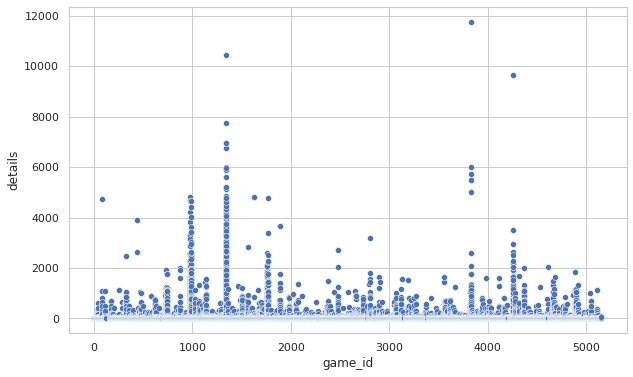

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
x_column = "game_id"
y_column = "details"
# Convert Spark DataFrame to Pandas for plotting
df_PD = dfh_of_play.select(x_column, y_column).toPandas()

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_PD, x=x_column, y=y_column)
display(plt.show())

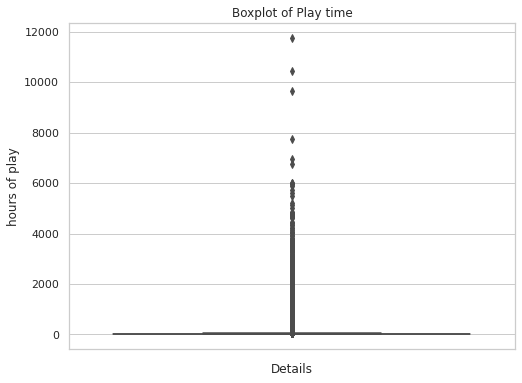

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import col
# Specify the column for the boxplot
y_column = "details"
# Convert Spark DataFrame to Pandas for plotting
df_PD = dfh_of_play.select(y_column).toPandas()

plt.figure(figsize=(8, 6))
sns.boxplot(data=df_PD, y=y_column)
plt.title("Boxplot of Play time")
plt.xlabel("Details")
plt.ylabel('hours of play')
plt.show()

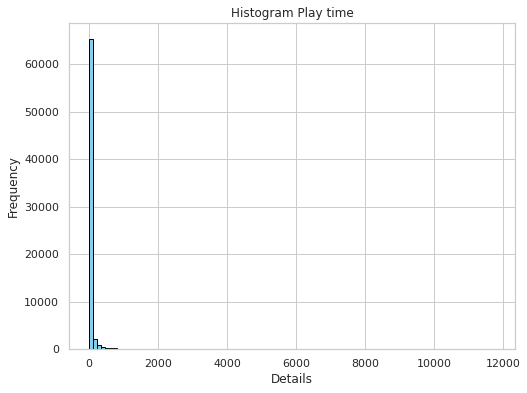

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import col

y_column = "details"
df_PD = dfh_of_play.select(y_column).toPandas()

# Create histogram using Matplotlib
plt.figure(figsize=(8, 6))
plt.hist(df_PD[y_column], bins=100, color='skyblue', edgecolor='black')  

plt.title("Histogram Play time")
plt.xlabel("Details")
plt.ylabel("Frequency")
plt.show()

check for median and the interquartile range to detect lower and upper boun, consequently every datapoint  that are out of the treshold will be considered as outlier

In [0]:
from pyspark.sql.functions import col

# Calculate quartiles
quartiles = dfh_of_play.approxQuantile("details", [0.25, 0.5, 0.75], 0.05)  # Include median (0.5)
q1 = quartiles[0]
median = quartiles[1]
q3 = quartiles[2]

# Calculate IQR
iqr = q3 - q1

# Define outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

print('Median:', median)
print('lower bound:', lower_bound)
print('upper bound:', upper_bound)


Median: 4.3
lower bound: -19.75
upper bound: 35.85


given that the data is not normaly distributed , after a few visualizations we understand see that there are outliers. Also,  the median is 4.4 

Infact as for the above test half of datapoints are between 0 and 4.4 hours and outliers are every datapoint contained outside of the lower/upper bound

###we try first to train a model with all of the data points, subsequently we train the model excluding the outliers( using the upper buond as treshhold) and lastly we train a model to get the best rmse result. will subsequently ask the business which model they want to keep, finding a balance between loosing datapoints and getting a better predictions or not loosing datapoints but getting a non accurate prediction. it need to be mentioned that clearly a larger range of values( no datapoints taken off ) will give a larger rmse , a smaller range of value(h.of play[whti the datapoints taken off]) will give a lower rmse.

In [0]:
(training, test)=dfh_of_play.randomSplit([0.80,0.20], seed=100)

print('full data',dfh_of_play.count())
print('training data',training.count())
print('testing data',test.count())

full data 70489
training data 56471
testing data 14018


In [0]:
from pyspark.ml.recommendation import ALS

als = ALS(maxIter=10, regParam=5 ,userCol='Member_id', itemCol='game_id', ratingCol='details', seed=17)

model= als.fit(training)



2024/04/09 17:42:14 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '2bddedd6b5424303b60e451bbee9c3f7', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/04/09 17:42:47 WARNING mlflow.pyspark.ml: Model ALS_e0948aad367e will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


In [0]:
predictions= model.transform(test).dropna()
predictions.show()

+---------+-------+-------+----------+
|Member_id|game_id|details|prediction|
+---------+-------+-------+----------+
|     5250|   1337|    0.2| 18.473663|
|    76767|    728|   12.5| -80.46069|
|    76767|    742|    9.7| 307.33154|
|    76767|   3224|   15.0|  79.75061|
|    76767|   5022|    0.4|  0.767933|
|    86540|    620|    0.7|  38.33596|
|    86540|   3223|    0.2|0.30479154|
|    86540|   3749|    0.2| 0.9723986|
|    86540|   4517|    1.8|0.89763916|
|    86540|   4597|    0.2| 6.7847776|
|    86540|   5054|   37.0| 21.858826|
|   229911|   1132|    0.4|-61.010185|
|   229911|   2274|    0.4| 2.9457889|
|   229911|   3223|    0.1|-0.6334639|
|   298950|    177|    0.6|  6.172306|
|   298950|    523|   21.0|  8.820671|
|   298950|    747|    0.9|  4.646269|
|   298950|   1105|   49.0| 31.400473|
|   298950|   1116|   22.0| 12.908844|
|   298950|   1249|   28.0| 13.886067|
+---------+-------+-------+----------+
only showing top 20 rows



In [0]:
from pyspark.ml.evaluation import RegressionEvaluator

evaluator= RegressionEvaluator(metricName='rmse', labelCol='details', predictionCol='prediction')
rmse=evaluator.evaluate(predictions)
print('Root mean Square error is ',rmse)  

Root mean Square error is  186.74215400917595


In [0]:
mlflow.start_run()
mlflow.log_param("maxIter", 10)
mlflow.log_param("regParam", 5)
mlflow.log_param("rank", 10) 
mlflow.log_metric("rmse", rmse)
mlflow.spark.log_model(model, "model")
mlflow.end_run()

2024/04/09 17:43:21 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
/databricks/python/lib/python3.9/site-packages/_distutils_hack/__init__.py:30: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


###We decide to take off the outliers using the interquartile range 

In [0]:
from pyspark.sql.functions import col

print(dfh_of_play.count())
dfh_of_play_noOutliers = dfh_of_play.filter(col("details") <= 35.85)
print(dfh_of_play_noOutliers.count())

70489
58503


In [0]:
dfh_of_play_noOutliers.describe().show()

+-------+--------------------+------------------+------------------+
|summary|           Member_id|           game_id|           details|
+-------+--------------------+------------------+------------------+
|  count|               58503|             58503|             58503|
|   mean|1.0607018070068201E8|2506.1902979334395|6.3703536570774615|
| stddev| 7.219379471650462E7|1479.5084498096833| 7.996256518533653|
|    min|                5250|                 1|               0.1|
|    max|           309903146|              5155|              35.0|
+-------+--------------------+------------------+------------------+



so we have lost about 12000 datapoints that were outliers
we check again the distribution:

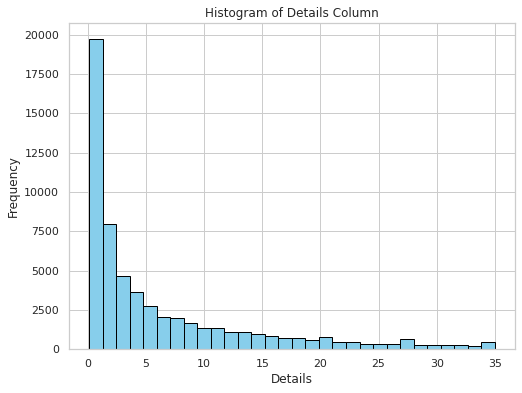

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import col

# Specify the column for the histogram
y_column = "details"

# Convert Spark DataFrame to Pandas for plotting
df_PD = dfh_of_play_noOutliers.select(y_column).toPandas()

# Create histogram using Matplotlib
plt.figure(figsize=(8, 6))
plt.hist(df_PD[y_column], bins=30, color='skyblue', edgecolor='black')  # Adjust the number of bins as needed

# Add titles and labels
plt.title("Histogram of Details Column")
plt.xlabel("Details")
plt.ylabel("Frequency")

# Display the plot
plt.show()

we visualize another boxplot from the data  where we already took some of the outlier off

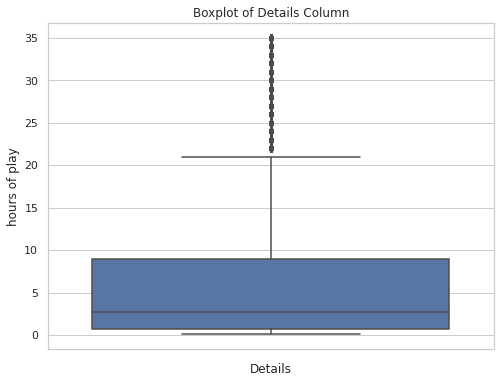

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import col

# Specify the column for the boxplot
y_column = "details"

# Convert Spark DataFrame to Pandas for plotting
df_PD = dfh_of_play_noOutliers.select(y_column).toPandas()

# Create boxplot using seaborn
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_PD, y=y_column)

# Display the plot
plt.title("Boxplot of Details Column")
plt.xlabel("Details")
plt.ylabel('hours of play')
plt.show()

the distribution is still not normal even after taking off the outliers.We train our model:

In [0]:
(training, test)=dfh_of_play_noOutliers.randomSplit([0.80,0.20], seed=100)
als = ALS(maxIter=15, regParam=0.01, userCol='Member_id', itemCol='game_id', ratingCol='details', seed=17)
model2= als.fit(training)
predictions= model2.transform(test).dropna()
predictions.show()
rmse=evaluator.evaluate(predictions)
print('Root mean Square error is ',rmse) 

2024/04/09 17:44:20 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '70e0fafc00de48a1ba4b1e74307e842d', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/04/09 17:45:11 WARNING mlflow.pyspark.ml: Model ALS_a23ca997f972 will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


+---------+-------+-------+-----------+
|Member_id|game_id|details| prediction|
+---------+-------+-------+-----------+
| 16167221|    981|    2.8|  -8.366537|
| 16167221|   2988|    1.1|  28.912807|
| 16167221|   4258|    2.1| -18.156885|
| 16167221|   4370|    0.3|   81.34074|
| 35264447|    496|    0.1| -0.9114143|
| 35264447|    617|   11.6|-0.13749889|
| 75689918|    982|    0.4|  19.824984|
| 75689918|   3532|    0.3| 0.87621546|
| 84471496|    554|    0.3|-0.59494185|
| 84471496|   2186|    1.4| -7.2127447|
| 84471496|   2532|    1.5|  1.3389133|
| 84471496|   3224|    1.5| -3.9567606|
| 84471496|   3943|    3.7|    19.8423|
| 92297975|    742|    1.5| 0.16647679|
| 95059220|    741|    0.7|  12.022885|
| 95059220|   3487|    0.8|-0.10793361|
| 99616757|    448|    0.1|   0.433724|
| 99616757|   2448|    0.5|-0.07881404|
|102465357|    982|    4.7|    11.3349|
|109780632|   1895|    8.2|  7.6803613|
+---------+-------+-------+-----------+
only showing top 20 rows

Root mean Squa

In [0]:
mlflow.start_run()
mlflow.log_param("maxIter", 15)
mlflow.log_param("regParam", 0.1)
mlflow.log_param("rank", 10) 
mlflow.log_metric("rmse", rmse)
mlflow.spark.log_model(model, "model2")
mlflow.end_run()

2024/04/09 17:45:41 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


# the model with lowes rmse is the one above but possibly isn't the best becouse we cutted many datapoints

In [0]:
# #create the parameter grid
# #copied from last week
# from pyspark.ml.tuning import ParamGridBuilder

# parameters= ParamGridBuilder()\
#     .addGrid(als.regParam,[0.001,0.005,0.01,0.05,0.1])\
#     .addGrid(als.maxIter,[5,10,15])\
#     .build()

In [0]:
# create the parameter grid
from pyspark.ml.tuning import ParamGridBuilder

parameters= ParamGridBuilder()\
    .addGrid(als.rank,[1,2])\
    .addGrid(als.regParam,[0.001, 0.01, 0.1])\
    .addGrid(als.maxIter,[1,2])\
    .build()

In [0]:
from pyspark.ml.tuning import TrainValidationSplit
# Define TrainValidationSplit
tvs = TrainValidationSplit() \
    .setSeed(100) \
    .setTrainRatio(0.75) \
    .setEstimatorParamMaps(parameters) \
    .setEstimator(als) \
    .setEvaluator(evaluator)

In [0]:
(training, test)=dfh_of_play_noOutliers.randomSplit([0.80,0.20], seed=17)
gridsearchModel = tvs.fit(training)

2024/04/09 17:46:27 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '20ebcda2a5414d01a9b9fc4604ec6650', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/04/09 17:48:23 WARNING mlflow.pyspark.ml: Model TrainValidationSplitModel_16b5a85919b0 will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


In [0]:
bestModel=gridsearchModel.bestModel

print('Prameters for best model with data no outliers: ')
print('Rank Parmeter : ',bestModel.rank)
print('RegParam Parameter: ',bestModel._java_obj.parent().getRegParam())
print('MaxIter Parameter:', bestModel._java_obj.parent().getMaxIter())


Prameters for best model with data no outliers: 
Rank Parmeter :  1
RegParam Parameter:  0.001
MaxIter Parameter: 1


#probably the best model is the one which has the outliers cut off at the upper bound so we try our best model based on that data:
#DFH_of_play_noOutliers

we use the setting from grid search:

In [0]:
from pyspark.ml.recommendation import ALS
from pyspark.ml.evaluation import RegressionEvaluator  

# Splitting the data with a seed
(training, test) = dfh_of_play_noOutliers.randomSplit([0.80, 0.20], seed=100)

# Defining the ALS model with parameters
als = ALS(maxIter=1, regParam=0.01, rank=1, userCol='Member_id', itemCol='game_id', ratingCol='details' ,seed=17)

# Fitting the model on the training data
model3 = als.fit(training)

# Making predictions on the test data and dropping null values
predictions = model3.transform(test).dropna()

# Evaluating the model
evaluator = RegressionEvaluator(metricName='rmse', labelCol='details', predictionCol='prediction')
rmse = evaluator.evaluate(predictions)
print('Root mean Square error is ', rmse)

2024/04/09 17:48:23 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'b2d1ce4b879f4fa1a92256e3c2f36401', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2024/04/09 17:48:29 WARNING mlflow.pyspark.ml: Model ALS_29cf1dae1d44 will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


Root mean Square error is  14.86234981119068


In [0]:
mlflow.start_run()
mlflow.log_param("maxIter", 1)
mlflow.log_param("regParam", 0.001)
mlflow.log_param("rank", 1) 
mlflow.log_metric("rmse", rmse)
mlflow.spark.log_model(model, "model3")
mlflow.end_run()

2024/04/09 17:48:44 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


###we set the regparam at 50. regparam represents the regularization parameter, often denoted as λ (lambda). Regularization is a technique used to prevent overfitting by penalizing large values of model parameters.

In [0]:
from pyspark.ml.recommendation import ALS
from pyspark.ml.evaluation import RegressionEvaluator  

# Splitting the data with a seed
(training, test) = dfh_of_play_noOutliers.randomSplit([0.80, 0.20], seed=100)

# Defining the ALS model with parameters
als = ALS(maxIter=1, regParam=50, rank=2, userCol='Member_id', itemCol='game_id', ratingCol='details',seed=17)

# Fitting the model on the training data
model4 = als.fit(training)

# Making predictions on the test data and dropping null values
predictions = model4.transform(test).dropna()

# Evaluating the model
evaluator = RegressionEvaluator(metricName='rmse', labelCol='details', predictionCol='prediction')
rmse = evaluator.evaluate(predictions)

# Printing the RMSE
print('Root mean Square error is ', rmse)

2024/04/09 17:55:48 WARNING mlflow.pyspark.ml: Model ALS_a89b24332315 will not be autologged because it is not allowlisted or or because one or more of its nested models are not allowlisted. Call mlflow.spark.log_model() to explicitly log the model, or specify a custom allowlist via the spark.mlflow.pysparkml.autolog.logModelAllowlistFile Spark conf (see mlflow.pyspark.ml.autolog docs for more info).


Root mean Square error is  10.420997110279563


In [0]:
mlflow.start_run()
mlflow.log_param("maxIter", 1)
mlflow.log_param("regParam", 50)
mlflow.log_param("rank", 12) 
mlflow.log_metric("rmse", rmse)
mlflow.spark.log_model(model, "model4")
mlflow.end_run()

2024/04/09 17:49:55 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


 In this case where best parameters found by the search do not lead to improved performance on unseen data. but increasing the regparam to 50 we get a better result.